<a href="https://colab.research.google.com/github/alicesbarros/NetworkAnalysis_Trabalho02/blob/main/Unidade01_Trabalho02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Analisando os voos no Brasil
Disciplina: Análise de Redes

Estudante: Alice Soares Pereira de Barros

Antes de começar, vamos executar as células de código abaixo:

In [ ]:
!pip install nxviz=='0.6.3'

In [ ]:
# import usefull packages
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import nxviz as nv
import numpy as np

In [ ]:
# download the dataset: GRAPHML 
#!gdown https://github.com/alvarofpp/dataset-flights-brazil/data/air_traffic.graphml

#!gdown https://drive.google.com/uc?id=1wp1ob1h0wszn8niKjV0pJE6BeqxTYGct

...

In [ ]:
# download the dataset: CSV (AIRPORT) 
!gdown  https://drive.google.com/uc?id=1u70O6NxMTcgVqYTD8vsIj0msRLDHLDV1

Downloading...
From: https://drive.google.com/uc?id=1u70O6NxMTcgVqYTD8vsIj0msRLDHLDV1
To: /content/airports.csv
100% 87.6k/87.6k [00:00<00:00, 31.3MB/s]


In [ ]:
# download the dataset: CSV (ANAC) 
!gdown  https://drive.google.com/uc?id=15Jczl99Oyjp9kP5pYE7xKi59AYFVFxi2

Downloading...
From: https://drive.google.com/uc?id=15Jczl99Oyjp9kP5pYE7xKi59AYFVFxi2
To: /content/anac.csv
100% 252M/252M [00:01<00:00, 134MB/s]


In [ ]:
import pandas as pd

df_csv_airport = pd.read_csv("airports.csv")
df_csv_anac = pd.read_csv("anac.csv")

G = nx.Graph()

#Para o gráfico G, por codigo ICAO, usando para a medida de assortatividade
# A partir dessa linha, o código está como foi mostrado em aula pelos colegas Brenda e Paulo
for indice, linha in df_csv_airport.iterrows():
  #Por 'code'
  G.add_node(linha["code"],
             name=linha["name"],
             country=linha["country"],
             latitude=linha["lat_geo_point"],
             longitude=linha["lon_geo_point"],
             region=linha["region"]
             )

edges_df = df_csv_anac[["origin_airport_abbreviation", 
                        "destination_airport_abbreviation",]].dropna()

edges_df = edges_df.groupby(edges_df.columns.tolist(), as_index=False).size()

for indice, linha in edges_df.iterrows():
  if linha["origin_airport_abbreviation"] == linha["destination_airport_abbreviation"]:
    continue
  G.add_edge(linha["origin_airport_abbreviation"], linha["destination_airport_abbreviation"], flight_count = linha["size"])
  

nx.write_graphml(G, "air_traffic.graphml")

In [ ]:
G.nodes(data=True)

NodeDataView({'KDFW': {'name': 'DALLAS & FORT WORTH, TEXAS', 'country': 'ESTADOS UNIDOS DA AMÉRICA', 'latitude': '32.896801', 'longitude': '-97.038002', 'region': nan}, 'KJFK': {'name': 'NEW YORK, NEW YORK', 'country': 'ESTADOS UNIDOS DA AMÉRICA', 'latitude': '40.639801', 'longitude': '-73.7789', 'region': nan}, 'KMIA': {'name': 'MIAMI, FLORIDA', 'country': 'ESTADOS UNIDOS DA AMÉRICA', 'latitude': '25.79319953918457', 'longitude': '-80.29060363769531', 'region': nan}, 'SBCF': {'name': 'CONFINS', 'country': 'BRASIL', 'latitude': '-19.62444305419922', 'longitude': '-43.97194290161133', 'region': 'SUDESTE'}, 'SBGL': {'name': 'RIO DE JANEIRO', 'country': 'BRASIL', 'latitude': '-22.8099994659', 'longitude': '-43.2505569458', 'region': 'SUDESTE'}, 'SBGR': {'name': 'GUARULHOS', 'country': 'BRASIL', 'latitude': '-23.435556411743164', 'longitude': '-46.47305679321289', 'region': 'SUDESTE'}, 'SGAS': {'name': 'ASUNCIÓN', 'country': 'PARAGUAI', 'latitude': '-25.239999771118164', 'longitude': '-57.

In [ ]:
print("A rede possui {} vértices e {} conexões".format(G.number_of_nodes(),
                                                       G.number_of_edges()))

A rede possui 1083 vértices e 9613 conexões


In [ ]:
#Testando se há alguma conexão de um nó com ele mesmo
test_self_loop_G = list(nx.selfloop_edges(G))
test_self_loop_G

[]

.

Estudo sobre a Assortatividade da Rede, considerando como atributo a Região onde está localizado o aeroporto.


- Gerar um Gráfico similar, considerando a Região do Aeroporto como grupo

In [ ]:
#Para separar apenas os 'codes' do Brasil -> para ficar com apenas os do Brasil
#G_g = nx.Graph()

pais_L = list(G.nodes("country")) #Lista com todos os países e o ICAO respectivo
br_L = []

#selecionando todos os 'code' (ICAO) do Brasil
for cd, ct in pais_L:
  if ct == "BRASIL":
    br_L.append(cd)

In [ ]:
pais_L

In [ ]:
br_L

In [ ]:
#configurando os ICAO de cada aeroporto do Brasil
ICAO_ = set(br_L)

icao_dict = {node: (node in ICAO_) for node in G}
nx.set_node_attributes(G, icao_dict, "code")

In [ ]:
sub_g = nx.subgraph(G, ICAO_)

In [ ]:
sub_g.nodes(data=True)

NodeDataView({'SSUV': {'name': 'UNIÃO DA VITÓRIA', 'country': 'BRASIL', 'latitude': '-26.2334', 'longitude': '-51.067797', 'region': 'SUL', 'code': True}, 'SBJP': {'name': 'SANTA RITA', 'country': 'BRASIL', 'latitude': '-7.145833015440001', 'longitude': '-34.9486122131', 'region': 'NORDESTE', 'code': True}, 'SWEE': {'name': 'ATALAIA DO NORTE', 'country': 'BRASIL', 'latitude': '-4.52377986908', 'longitude': '-71.560798645', 'region': 'NORTE', 'code': True}, 'SDOV': {'name': 'MOZARLÂNDIA', 'country': 'BRASIL', 'latitude': '-14.770400047302246', 'longitude': '-50.5640983581543', 'region': 'CENTRO-OESTE', 'code': True}, 'SWNO': {'name': 'NOVA OLINDA DO NORTE', 'country': 'BRASIL', 'latitude': '-3.8877780437469482', 'longitude': '-59.07833480834961', 'region': 'NORTE', 'code': True}, 'SNAB': {'name': 'ARARIPINA', 'country': 'BRASIL', 'latitude': '-7.5867600440979', 'longitude': '-40.535499572753906', 'region': 'NORDESTE', 'code': True}, 'SBNT': {'name': 'PARNAMIRIM', 'country': 'BRASIL', 'l

In [ ]:
len(sub_g.nodes())

495

.

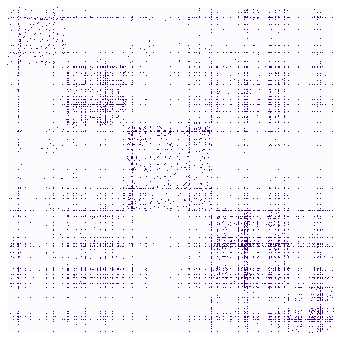

In [ ]:
# Create the MatrixPlot object: rg
rg = nv.MatrixPlot(sub_g, node_color='region',
                   node_order='region')

# Change the cmap prior to drawing.
rg.cmap = plt.cm.get_cmap("Purples")

# Draw rg (region) to the screen
rg.draw()

# Display the plot
plt.show()

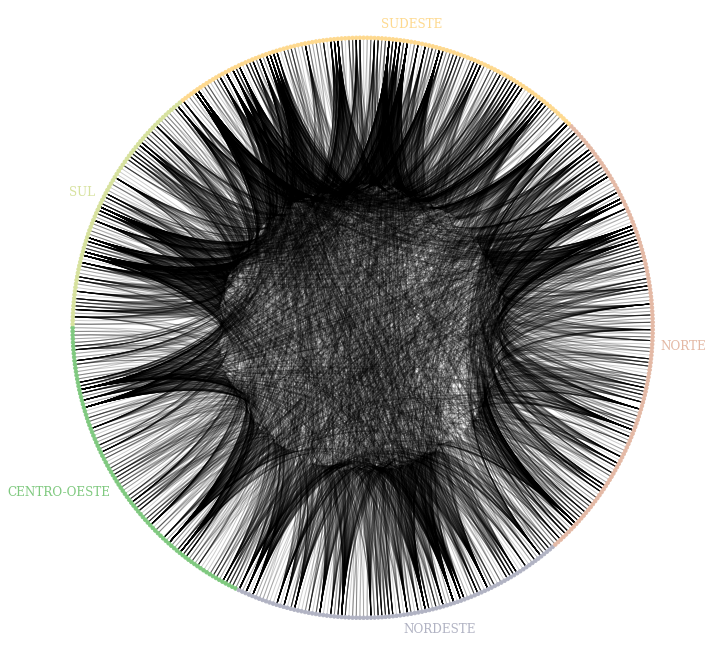

In [ ]:
# Import necessary modules to use Circos plot
from nxviz import CircosPlot 

# Create the CircosPlot object: c
c = CircosPlot(sub_g, node_color='region', 
               node_grouping='region',
               node_order="region",
               node_labels=False,
               group_label_position="middle",
               group_label_color=True,
               figsize = (10,10),
               nodeprops={"radius": 0.5},
               fontsize=12
               )

# Draw c to the screen
c.draw()
c.figure.tight_layout()

# Display the plot
plt.show()

In [ ]:
nx.attribute_assortativity_coefficient(sub_g,"region")

0.3672813017358277

In [ ]:
m_m = nx.attribute_mixing_matrix(sub_g,'region')
m_m

array([[0.07882781, 0.01067697, 0.02078601, 0.05599727, 0.01317583],
       [0.01067697, 0.05224898, 0.02226261, 0.03441617, 0.01226715],
       [0.02078601, 0.02226261, 0.13584734, 0.02782826, 0.00726942],
       [0.05599727, 0.03441617, 0.02782826, 0.17446615, 0.04009541],
       [0.01317583, 0.01226715, 0.00726942, 0.04009541, 0.06905952]])

In [ ]:
np.sum(m_m)

1.0

.

Realizar uma Análise Bivariada entre o Degree do Node e o Numero Médio de vizinhos (Neighbours)


Gerar um gráfico similar, considerando a rede do Brasil e de todas as regiões (Norte, Nordeste, Sul, Sudeste e Centro-Oeste)

In [ ]:
#Grau médio dos vizinhos
grau, med_grau_viz = zip(*nx.average_degree_connectivity(sub_g).items())

#Convertendo para lista
grau = list(grau)
med_grau_viz = list(med_grau_viz)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


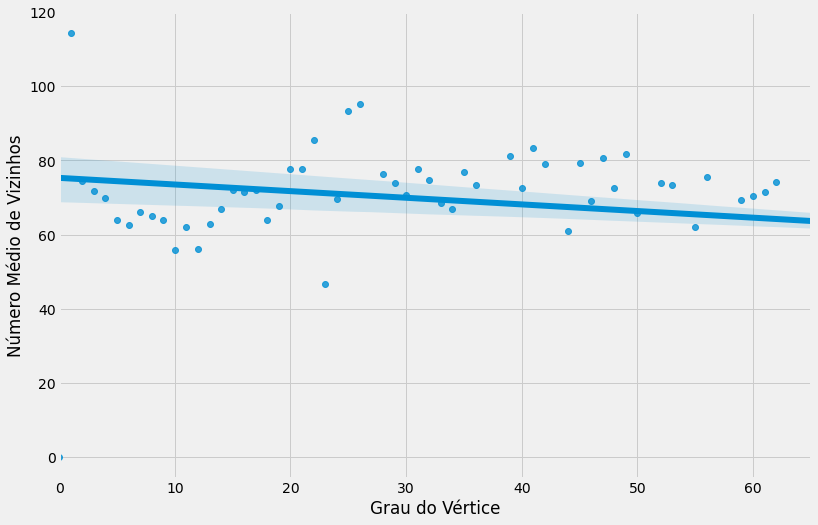

In [ ]:
import seaborn as sns

plt.style.use("fivethirtyeight")
fig, ax = plt.subplots(1,1,figsize=(12,8))

sns.regplot(grau,med_grau_viz,ax=ax)

ax.set_xlabel("Grau do Vértice")
ax.set_ylabel("Número Médio de Vizinhos")
ax.set_xlim(0,65)
"""
# Save figure
plt.savefig("assotartividade_grau.png", 
            format="png",
            dpi=400, 
            bbox_inches="tight",
            transparent=True)"""

#Mostrar o gráfico
plt.show()

In [ ]:
nx.degree_assortativity_coefficient(sub_g)

-0.2017097172979742

.

Quantos Componentes conectados existem na malha aérea brasileira

-> Caracterizando cada componente: quantidade, porcentagem por região


Quantidade:

In [ ]:
nx.is_connected(sub_g)

False

In [ ]:
list(nx.connected_components(sub_g))

In [ ]:
for component in list(nx.connected_components(sub_g)):
  print(len(component))

491
1
1
1
1


Porcentagem por Região:

Gráfico

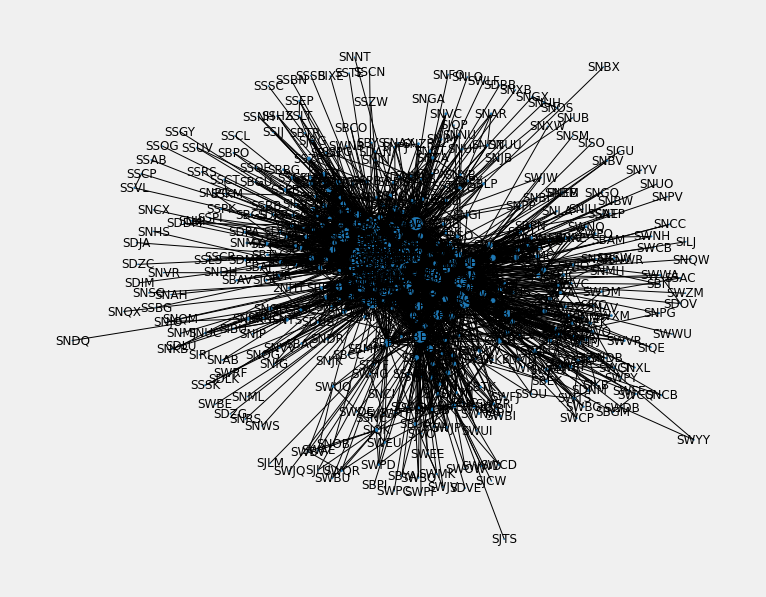

In [ ]:
#dica do professor:
fig, ax = plt.subplots(1, 1, figsize=(12,10))
subgraph = nx.subgraph(sub_g, list(nx.connected_components(sub_g))[0])
nx.draw_networkx(subgraph, pos=nx.spring_layout(subgraph),
                 node_size=[value for key, value in nx.degree(subgraph)], 
                 ax = ax)
ax.axis("off")
plt.show()

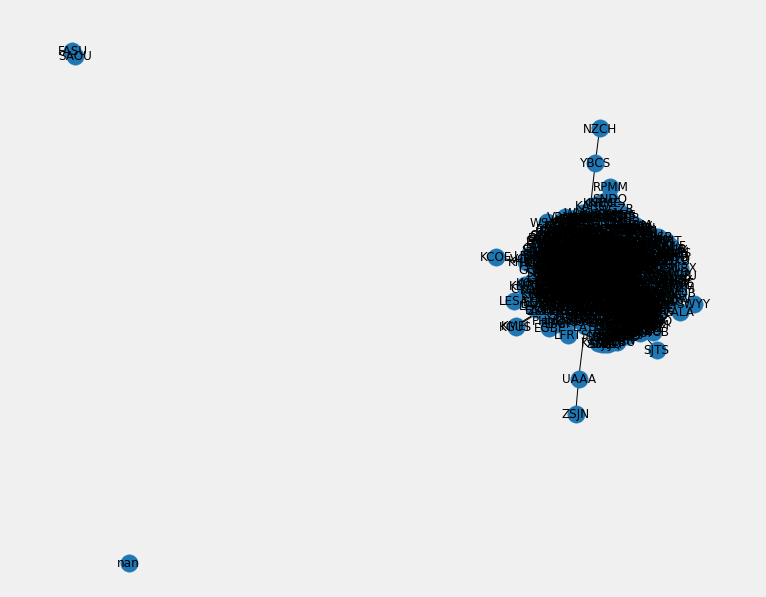

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(12,10))
nx.draw_networkx(G, pos=nx.spring_layout(G), ax = ax)
ax.axis("off")
plt.show()

.

Criar um cenário simulado, onde se deseja fazer uma viagem, com o seguinte trajeto:

Cidade 1 (Norte) -> Cidade 2 (Sul)

Cidade 2 (Sul) -> Cidade 3 (Nordeste)

Cidade 3 (Nordeste) -> Cidade 4 (Centro-Oeste)

Cidade 4 (Centro-Oeste) -> Cidade 5 (Sudeste)

usando o conceito do caminho mais curto 



In [ ]:
sub_g.is_directed()

False

In [ ]:
"""#configurando 'region'
REG_NORTE = set(("NORTE"))

regNorte_dict = {node: (node in REG_NORTE) for node in G}
nx.set_node_attributes(G, reg_dict, "regionN")"""

In [ ]:
sub_g.nodes(data=True)

NodeDataView({'SSUV': {'name': 'UNIÃO DA VITÓRIA', 'country': 'BRASIL', 'latitude': '-26.2334', 'longitude': '-51.067797', 'region': False, 'code': True, 'regionN': False}, 'SBJP': {'name': 'SANTA RITA', 'country': 'BRASIL', 'latitude': '-7.145833015440001', 'longitude': '-34.9486122131', 'region': False, 'code': True, 'regionN': False}, 'SWEE': {'name': 'ATALAIA DO NORTE', 'country': 'BRASIL', 'latitude': '-4.52377986908', 'longitude': '-71.560798645', 'region': False, 'code': True, 'regionN': False}, 'SDOV': {'name': 'MOZARLÂNDIA', 'country': 'BRASIL', 'latitude': '-14.770400047302246', 'longitude': '-50.5640983581543', 'region': False, 'code': True, 'regionN': False}, 'SWNO': {'name': 'NOVA OLINDA DO NORTE', 'country': 'BRASIL', 'latitude': '-3.8877780437469482', 'longitude': '-59.07833480834961', 'region': False, 'code': True, 'regionN': False}, 'SNAB': {'name': 'ARARIPINA', 'country': 'BRASIL', 'latitude': '-7.5867600440979', 'longitude': '-40.535499572753906', 'region': False, 'c

In [ ]:
N_S = sub_g.has_edge("NORTE", "SUL")
S_NE = sub_g.has_edge("SUL", "NORDESTE")
NE_CO = sub_g.has_edge("NORDESTE", "CENTRO-OESTE")
CO_SE = sub_g.has_edge("CENTRO-OESTE", "SUDESTE")

print(N_S, " ", S_NE, " ", NE_CO, " ", CO_SE)

False   False   False   False


In [ ]:
list(sub_g.nodes("region"))

In [ ]:
for cod, rg in list(sub_g.nodes("region")):
  



In [ ]:
#(nx.shortest_path(G))
nx.shortest_path(sub_g)

{'1AON': {'1AON': ['1AON'],
  '2NHT': ['1AON', 'SBBE', 'SBPS', '2NHT'],
  '6ASO': ['1AON', 'SBBE', 'SBCY', '6ASO'],
  'SBAA': ['1AON', 'SBBE', 'SBAA'],
  'SBAC': ['1AON', 'SBBE', 'SBFZ', 'SBAC'],
  'SBAE': ['1AON', 'SBBR', 'SBAE'],
  'SBAF': ['1AON', 'SBBE', 'SBBH', 'SBAF'],
  'SBAG': ['1AON', 'SBBE', 'SBGL', 'SBAG'],
  'SBAM': ['1AON', 'SBBE', 'SBIZ', 'SBAM'],
  'SBAN': ['1AON', 'SBBR', 'SBAN'],
  'SBAQ': ['1AON', 'SBBR', 'SBAQ'],
  'SBAR': ['1AON', 'SBBE', 'SBAR'],
  'SBAS': ['1AON', 'SBBR', 'SBAS'],
  'SBAT': ['1AON', 'SBBE', 'SBAT'],
  'SBAU': ['1AON', 'SBBR', 'SBAU'],
  'SBAV': ['1AON', 'SBBE', 'SBGL', 'SBAV'],
  'SBAX': ['1AON', 'SBBR', 'SBAX'],
  'SBBE': ['1AON', 'SBBE'],
  'SBBG': ['1AON', 'SBBE', 'SBGL', 'SBBG'],
  'SBBH': ['1AON', 'SBBE', 'SBBH'],
  'SBBI': ['1AON', 'SBBR', 'SBBI'],
  'SBBQ': ['1AON', 'SBBE', 'SBBH', 'SBBQ'],
  'SBBR': ['1AON', 'SBBR'],
  'SBBT': ['1AON', 'SBBR', 'SBBT'],
  'SBBU': ['1AON', 'SBBR', 'SBBU'],
  'SBBV': ['1AON', 'SBBE', 'SBBV'],
  'SBBW': ['1AON

.

Realizar um estudo sobre o Coeficiente de Clustering considerando a Rede da Malha Aérea Nacional, assim como as sub-redes aéreas de cada região